In [1]:
import os
import sys
import math
import argparse
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from sklearn.decomposition import PCA
from typing import Dict, List, Tuple, Iterable, Union, Optional, Set, Sequence, Callable, DefaultDict, Any

# Keras imports
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU, Lambda, Reshape, LayerNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.layers import SpatialDropout1D, SpatialDropout2D, SpatialDropout3D, add, concatenate
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Flatten, LSTM, RepeatVector
from tensorflow.keras.layers import Conv1D, Conv2D, Conv3D, UpSampling1D, UpSampling2D, UpSampling3D, MaxPooling1D
from tensorflow.keras.layers import MaxPooling2D, MaxPooling3D, AveragePooling1D, AveragePooling2D, AveragePooling3D, Layer
from tensorflow.keras.layers import SeparableConv1D, SeparableConv2D, DepthwiseConv2D, Concatenate, Add
from tensorflow.keras.layers import GlobalAveragePooling1D, GlobalAveragePooling2D, GlobalAveragePooling3D

%matplotlib inline
import matplotlib.pyplot as plt


# ML4CVD Imports
from ml4cvd.TensorMap import TensorMap
from ml4cvd.arguments import parse_args
from ml4cvd.models import make_multimodal_multitask_model, train_model_from_generators, make_hidden_layer_model, _conv_layer_from_kind_and_dimension
from ml4cvd.tensor_generators import TensorGenerator, big_batch_from_minibatch_generator, test_train_valid_tensor_generators
from ml4cvd.recipes import plot_predictions, infer_hidden_layer_multimodal_multitask


Tensor = tf.Tensor

ACTIVATION_CLASSES = {
    'leaky': LeakyReLU(),
    'prelu': PReLU(),
    'elu': ELU(),
    'thresh_relu': ThresholdedReLU,
}
ACTIVATION_FUNCTIONS = {
    'swish': tf.nn.swish,
    'gelu': tfa.activations.gelu,
    'lisht': tfa.activations.lisht,
    'mish': tfa.activations.mish,
}
NORMALIZATION_CLASSES = {
    'batch_norm': BatchNormalization,
    'layer_norm': LayerNormalization,
    'instance_norm': tfa.layers.InstanceNormalization,
    'poincare_norm': tfa.layers.PoincareNormalize,
}
CONV_REGULARIZATION_CLASSES = {
    # class name -> (dimension -> class)
    'spatial_dropout': {2: SpatialDropout1D, 3: SpatialDropout2D, 4: SpatialDropout3D},
    'dropout': defaultdict(lambda _: Dropout),
}
DENSE_REGULARIZATION_CLASSES = {
    'dropout': Dropout,  # TODO: add l1, l2
}

In [2]:

def _activation_layer(activation: str) -> Activation:
    return (
        ACTIVATION_CLASSES.get(activation, None)
        or Activation(ACTIVATION_FUNCTIONS.get(activation, None) or activation)
    )


def _normalization_layer(norm: str) -> Layer:
    if not norm:
        return lambda x: x
    return NORMALIZATION_CLASSES[norm]()


def _regularization_layer(dimension: int, regularization_type: str, rate: float):
    if not regularization_type:
        return lambda x: x
    if regularization_type in DENSE_REGULARIZATION_CLASSES:
        return DENSE_REGULARIZATION_CLASSES[regularization_type](rate)
    return CONV_REGULARIZATION_CLASSES[regularization_type][dimension](rate)


def _calc_start_shape(
        num_upsamples: int, output_shape: Tuple[int, ...], upsample_rates: Sequence[int], channels: int,
) -> Tuple[int, ...]:
    """
    Given the number of blocks in the decoder and the upsample rates, return required input shape to get to output shape
    """
    upsample_rates = list(upsample_rates) + [1] * len(output_shape)
    return tuple((shape // rate**num_upsamples for shape, rate in zip(output_shape[:-1], upsample_rates))) + (channels,)


class FlatToStructure:
    """Takes a flat input, applies a dense layer, then restructures to output_shape"""
    def __init__(
            self,
            output_shape: Tuple[int, ...],
            activation: str,
            normalization: str,
    ):
        self.input_shapes = output_shape
        self.dense = Dense(units=int(np.prod(output_shape)))
        self.activation = _activation_layer(activation)
        self.reshape = Reshape(output_shape)
        self.norm = _normalization_layer(normalization)

    def __call__(self, x: Tensor) -> Tensor:
        return self.reshape(self.norm(self.activation(self.dense(x))))


def _conv_layer_from_kind_and_dimension(
        dimension: int, conv_layer_type: str, conv_x: List[int], conv_y: List[int], conv_z: List[int],
) -> Tuple[Layer, List[Tuple[int, ...]]]:
    if dimension == 4 and conv_layer_type == 'conv':
        conv_layer = Conv3D
        kernel = zip(conv_x, conv_y, conv_z)
    elif dimension == 3 and conv_layer_type == 'conv':
        conv_layer = Conv2D
        kernel = zip(conv_x, conv_y)
    elif dimension == 2 and conv_layer_type == 'conv':
        conv_layer = Conv1D
        kernel = zip(conv_x)
    elif dimension == 3 and conv_layer_type == 'separable':
        conv_layer = SeparableConv2D
        kernel = zip(conv_x, conv_y)
    elif dimension == 2 and conv_layer_type == 'separable':
        conv_layer = SeparableConv1D
        kernel = zip(conv_x)
    elif dimension == 3 and conv_layer_type == 'depth':
        conv_layer = DepthwiseConv2D
        kernel = zip(conv_x, conv_y)
    else:
        raise ValueError(f'Unknown convolution type: {conv_layer_type} for dimension: {dimension}')
    return conv_layer, list(kernel)


def _upsampler(dimension, pool_x, pool_y, pool_z):
    if dimension == 4:
        return UpSampling3D(size=(pool_x, pool_y, pool_z))
    elif dimension == 3:
        return UpSampling2D(size=(pool_x, pool_y))
    elif dimension == 2:
        return UpSampling1D(size=pool_x)
    

    
def _one_by_n_kernel(dimension):
    return tuple([1] * (dimension - 1))


class DenseConvolutionalBlock:
    def __init__(
            self,
            *,
            dimension: int,
            block_size: int,
            conv_layer_type: str,
            filters: int,
            conv_x: List[int],
            conv_y: List[int],
            conv_z: List[int],
            activation: str,
            normalization: str,
            regularization: str,
            regularization_rate: float,
    ):
        conv_layer, kernels = _conv_layer_from_kind_and_dimension(dimension, conv_layer_type, conv_x, conv_y, conv_z)
        if isinstance(conv_layer, DepthwiseConv2D):
            self.conv_layers = [conv_layer(kernel_size=kernel, padding='same') for kernel in kernels]
        else:
            self.conv_layers = [conv_layer(filters=filters, kernel_size=kernel, padding='same') for kernel in kernels]
        self.activations = [_activation_layer(activation) for _ in range(block_size)]
        self.normalizations = [_normalization_layer(normalization) for _ in range(block_size)]
        self.regularizations = [_regularization_layer(dimension, regularization, regularization_rate) for _ in range(block_size)]
        print(f'Dense Block Convolutional Layers (num_filters, kernel_size): {list(zip([filters]*len(kernels), kernels))}')

    def __call__(self, x: Tensor) -> Tensor:
        dense_connections = [x]
        for i, (convolve, activate, normalize, regularize) in enumerate(
            zip(
                    self.conv_layers, self.activations, self.normalizations, self.regularizations,
            ),
        ):
            x = normalize(regularize(activate(convolve(x))))
            if i < len(self.conv_layers) - 1:  # output of block does not get concatenated to
                dense_connections.append(x)
                x = Concatenate()(dense_connections[:])  # [:] is necessary because of tf weirdness
        return x

    
class ConvDecoder2:
    def __init__(
            self,
            *,
            tensor_map_out: TensorMap,
            filters_per_dense_block: List[int],
            conv_layer_type: str,
            conv_x: List[int],
            conv_y: List[int],
            conv_z: List[int],
            block_size: int,
            activation: str,
            normalization: str,
            regularization: str,
            regularization_rate: float,
            upsample_x: int,
            upsample_y: int,
            upsample_z: int,
    ):
        dimension = tensor_map_out.axes()
        self.dense_blocks = [
            DenseConvolutionalBlock(
                dimension=tensor_map_out.axes(), conv_layer_type=conv_layer_type, filters=filters, conv_x=[x]*block_size,
                conv_y=[y]*block_size, conv_z=[z]*block_size, block_size=block_size, activation=activation, normalization=normalization,
                regularization=regularization, regularization_rate=regularization_rate,
            )
            for filters, x, y, z in zip(filters_per_dense_block, conv_x, conv_y, conv_z)
        ]
        conv_layer, _ = _conv_layer_from_kind_and_dimension(dimension, 'conv', conv_x, conv_y, conv_z)
        self.conv_label = conv_layer(tensor_map_out.shape[-1], _one_by_n_kernel(dimension), activation=tensor_map_out.activation, name=tensor_map_out.output_name())
        self.upsamples = [_upsampler(dimension, upsample_x, upsample_y, upsample_z) for _ in range(len(filters_per_dense_block) + 1)]
        print(f'Decode has: {list(enumerate(zip(self.dense_blocks, self.upsamples)))}')
    def __call__(self, x: Tensor) -> Tensor:
        for i, (dense_block, upsample) in enumerate(zip(self.dense_blocks, self.upsamples)):
            
            x = upsample(x)
            x = dense_block(x)
        return self.conv_label(x)
    
    

In [3]:
from tensorflow.keras.layers import Layer
from tensorflow import acos

def l2_norm(x, axis=None):
    """
    takes an input tensor and returns the l2 norm along specified axis
    """

    square_sum = K.sum(K.square(x), axis=axis, keepdims=True)
    norm = K.sqrt(K.maximum(square_sum, K.epsilon()))

    return norm

def pairwise_cosine_difference(t1, t2):
    """
    A [batch x n x d] tensor of n rows with d dimensions
    B [batch x m x d] tensor of n rows with d dimensions

    returns:
    D [batch x n x m] tensor of cosine similarity scores between each point i<n, j<m
    """
    t1_norm = t1 / l2_norm(t1, axis=-1)
    t2_norm = t2 / l2_norm(t2, axis=-1)
    dot = K.clip(K.batch_dot(t1, t2), -1, 1)
    return acos(dot)

class CosineLossLayer(Layer):
    """Layer that creates an Cosine loss."""
    def __init__(self, weight):
        super(CosineLossLayer, self).__init__()
        self.weight = weight
    def get_config(self):
        config = super().get_config().copy()
        config.update({'weight': self.weight})
        return config
    def call(self, inputs):
        # We use `add_loss` to create a regularization loss
        # that depends on the inputs.
        self.add_loss(self.weight * pairwise_cosine_difference(inputs[0], inputs[1]))
        return inputs

class L2LossLayer(Layer):
    """Layer that creates an L2 loss."""
    def __init__(self, weight):
        super(L2LossLayer, self).__init__()
        self.weight = weight
        
    def get_config(self):
        config = super().get_config().copy()
        config.update({'weight': self.weight})
        return config
    
    def call(self, inputs):
        self.add_loss(self.weight * tf.reduce_sum(tf.square(inputs[0] - inputs[1])))
        return inputs

In [4]:
def make_paired_autoencoder_model(
    pairs: List[Tuple[TensorMap, TensorMap]],
    pair_loss = 'cosine',
    **kwargs
) -> Model:
    inputs = {tm: Input(shape=tm.shape, name=tm.input_name()) for tm in args.tensor_maps_in}
    original_outputs = {tm:1 for tm in args.tensor_maps_out}
    multimodal_activations = []
    outputs = []
    losses = []
    for left, right in pairs:
        args.tensor_maps_in = [left]
        left_model = make_multimodal_multitask_model(**args.__dict__)
        encode_left = make_hidden_layer_model(left_model, [left], args.hidden_layer)
        h_left = encode_left(inputs[left])
        
        args.tensor_maps_in = [right]
        right_model = make_multimodal_multitask_model(**args.__dict__)     
        encode_right = make_hidden_layer_model(right_model, [right], args.hidden_layer)
        h_right = encode_right(inputs[right])        
        
        if pair_loss == 'cosine':
            loss_layer = CosineLossLayer(1.0)
        elif pair_loss == 'euclid':
            loss_layer = L2LossLayer(1.0)
        
        paired_embeddings = loss_layer([h_left, h_right])
        multimodal_activations.extend(paired_embeddings)
        
    multimodal_activation = Concatenate()(multimodal_activations)
    
    pre_decoder_shapes: Dict[TensorMap, Optional[Tuple[int, ...]]] = {}
    for tm in args.tensor_maps_out:
        shape = _calc_start_shape(num_upsamples=len(args.dense_blocks), output_shape=tm.shape, 
                                  upsample_rates=[args.pool_x, args.pool_y, args.pool_z], 
                                  channels=args.dense_blocks[-1])    
        
        restructure = FlatToStructure(output_shape=shape, activation=args.activation, 
                                      normalization=args.dense_normalize)
        
        decode = ConvDecoder2(
            tensor_map_out=tm,
            filters_per_dense_block=args.dense_blocks[::-1],
            conv_layer_type=args.conv_type,
            conv_x=args.conv_x,
            conv_y=args.conv_y,
            conv_z=args.conv_z,
            block_size=args.block_size,
            activation=args.activation,
            normalization=args.conv_normalize,
            regularization=args.conv_regularize,
            regularization_rate=args.conv_regularize_rate,
            upsample_x=args.pool_x,
            upsample_y=args.pool_y,
            upsample_z=args.pool_z,
        )
        
        outputs.append(decode(restructure(multimodal_activation)))
        losses.append(tm.loss)

    args.tensor_maps_out =  list(original_outputs.keys())
    args.tensor_maps_in = list(inputs.keys())
    
    m = Model(inputs=list(inputs.values()), outputs=outputs)
    my_metrics = {tm.output_name(): tm.metrics for tm in args.tensor_maps_out}
    opt = Adam(lr=kwargs['learning_rate'], beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    m.compile(optimizer=opt, loss=losses, metrics=my_metrics)
    m.summary()
    
    if kwargs['model_layers'] is not None:
        m.load_weights(kwargs['model_layers'], by_name=True)
        print(f"Loaded model weights from:{kwargs['model_layers']}")
        
    return m

In [ ]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/', 
            '--input_tensors', 'ecg.ecg_rest', 'mri.lax_4ch_diastole_slice0_224_3d', 
            '--output_tensors', 'ecg.ecg_rest', 'mri.cine_segmented_lax_4ch_diastole',
            '--activation', 'swish',
            '--conv_layers', '32',
            '--conv_x', '9', '9', '9',
            '--conv_y', '3', '3', '3', 
            '--conv_z', '3', '3', '3',
            '--dense_blocks', '32', '32', '32',
            '--block_size', '3',
            '--dense_layers', '512',
            '--pool_x', '2',
            '--pool_y', '2',
            '--batch_size', '1',
            '--patience', '44',
            '--epochs', '496',
            '--learning_rate', '0.0001',
            '--training_steps', '128',
            '--validation_steps', '30',
            '--test_steps', '8',
            '--num_workers', '4',
            '--inspect_model',
            '--tensormap_prefix', 'ml4cvd.tensormap.ukb',
            '--id', 'ecg_mri_lax_4ch_diastole_euclid_paired_segmenter_512d']
args = parse_args()
pairs = [(args.tensor_maps_in[0], args.tensor_maps_in[1])]
overparameterized_model = make_paired_autoencoder_model(pairs, pair_loss='euclid', **args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
train_model_from_generators(
        overparameterized_model, generate_train, generate_valid, args.training_steps, args.validation_steps, args.batch_size,
        args.epochs, args.patience, args.output_folder, args.id, args.inspect_model, args.inspect_show_labels,
)

2020-08-25 12:25:45,736 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_segmenter_512d/log_2020-08-25_12-25_0.log.
2020-08-25 12:25:45,931 - arguments:435 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/sax-lax-40k-lvm/2020-01-29/ --input_tensors ecg.ecg_rest mri.lax_4ch_diastole_slice0_224_3d --output_tensors ecg.ecg_rest mri.cine_segmented_lax_4ch_diastole --activation swish --conv_layers 32 --conv_x 9 9 9 --conv_y 3 3 3 --conv_z 3 3 3 --dense_blocks 32 32 32 --block_size 3 --dense_layers 512 --pool_x 2 --pool_y 2 --batch_size 1 --patience 44 --epochs 496 --learning_rate 0.0001 --training_steps 128 --validation_steps 30 --test_steps 8 --num_workers 4 --inspect_model --tensormap_prefix ml4cvd.tensormap.ukb --id ecg_mri_lax_4ch_diastole_euclid_paired_segmenter_512d

2020-08-25 12:25:45,932 - arguments:436 - INFO - Arguments are Namespace(activation='swish', aligned_dimensi

2020-08-25 12:25:49,331 - models:896 - WARNING - Number of x dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-08-25 12:25:49,332 - models:896 - WARNING - Number of y dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-08-25 12:25:49,333 - models:896 - WARNING - Number of z dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-08-25 12:25:49,336 - models:383 - INFO - Residual Block Convolutional Layers (num_filters, kernel_size): [(32, (9, 3))]
2020-08-25 12:25:49,339 - models:421 - INFO - Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9, 3)), (32, (9, 3)), (32, (9, 3))]
2020-08-25 12:25:49,343 - models:421 - INFO - Dense Block Convolutional La

Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9,)), (32, (9,)), (32, (9,))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9,)), (32, (9,)), (32, (9,))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9,)), (32, (9,)), (32, (9,))]
Decode has: [(0, (<__main__.DenseConvolutionalBlock object at 0x7fa1d034fa90>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7fa1d04788d0>)), (1, (<__main__.DenseConvolutionalBlock object at 0x7fa1d034fac8>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7fa1d0478dd8>)), (2, (<__main__.DenseConvolutionalBlock object at 0x7fa1d0478748>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7fa1f4557a90>))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9, 3)), (32, (9, 3)), (32, (9, 3))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (9, 3)), (32, (9, 3)), (32, (9, 3))]
Dense Block Convolution

2020-08-25 12:25:56,708 - tensor_generators:661 - INFO - Found 51591 train, 14804 validation, and 7298 testing tensors at: /mnt/disks/sax-lax-40k-lvm/2020-01-29/
2020-08-25 12:25:57,199 - models:1419 - INFO - Saving architecture diagram to:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_segmenter_512d/architecture_graph_ecg_mri_lax_4ch_diastole_euclid_paired_segmenter_512d.png
2020-08-25 12:25:58,868 - tensor_generators:151 - INFO - Started 3 train workers with cache size 0.4375GB.
2020-08-25 12:25:58,965 - tensor_generators:151 - INFO - Started 1 validation workers with cache size 0.4375GB.
Train for 128 steps, validate for 1 steps
128/128 [==============================] - 36s 284ms/step - loss: 2.4570 - output_strip_continuous_loss: 0.9985 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 1.1566 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.6948 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.6617 - output_

  2/128 [..............................] - ETA: 17s - loss: 1.6889 - output_strip_continuous_loss: 0.9728 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.5877 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8091 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.8620 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

127/128 [============================>.] - ETA: 0s - loss: 1.6125 - output_strip_continuous_loss: 0.9865 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.5287 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8372 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9420 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segm

Epoch 2/496
127/128 [============================>.] - ETA: 0s - loss: 1.4172 - output_strip_continuous_loss: 0.8754 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.4295 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8677 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9498 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - outp

Epoch 3/496
127/128 [============================>.] - ETA: 0s - loss: 1.3104 - output_strip_continuous_loss: 0.8352 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.3912 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8762 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9466 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.0593 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_c

Epoch 4/496
127/128 [============================>.] - ETA: 0s - loss: 1.3166 - output_strip_continuous_loss: 0.8572 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.3661 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8842 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9486 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.1014 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 3.0519e-04 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_c

Epoch 5/496
127/128 [============================>.] - ETA: 0s - loss: 1.2147 - output_strip_continuous_loss: 0.8138 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.3348 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8919 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9547 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.1276 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_c

Epoch 6/496
127/128 [============================>.] - ETA: 0s - loss: 1.1365 - output_strip_continuous_loss: 0.7783 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.3042 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9004 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9588 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.1985 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_c

Epoch 7/496
127/128 [============================>.] - ETA: 0s - loss: 1.1523 - output_strip_continuous_loss: 0.7975 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.3083 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8964 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9543 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.2577 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0021 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_

Epoch 8/496
127/128 [============================>.] - ETA: 0s - loss: 1.1218 - output_strip_continuous_loss: 0.7976 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2765 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9054 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9585 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3228 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0111 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_

Epoch 9/496
127/128 [============================>.] - ETA: 0s - loss: 1.0992 - output_strip_continuous_loss: 0.7643 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2956 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.8998 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9563 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.0803 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.2414 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0382 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segm

Epoch 10/496
127/128 [============================>.] - ETA: 0s - loss: 1.0732 - output_strip_continuous_loss: 0.7571 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2768 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9045 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9571 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.1141 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3013 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0396 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 11/496
127/128 [============================>.] - ETA: 0s - loss: 1.0888 - output_strip_continuous_loss: 0.7919 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2584 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9084 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9597 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.2479 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4307 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0590 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 12/496
127/128 [============================>.] - ETA: 0s - loss: 1.0176 - output_strip_continuous_loss: 0.7089 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2737 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9029 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9558 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.3352 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3586 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0295 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 13/496
127/128 [============================>.] - ETA: 0s - loss: 1.0545 - output_strip_continuous_loss: 0.7661 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2468 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9107 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9619 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4170 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.2669 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0385 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 14/496
127/128 [============================>.] - ETA: 0s - loss: 1.0253 - output_strip_continuous_loss: 0.7565 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2326 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9151 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9634 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4796 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3407 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0498 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 15/496
127/128 [============================>.] - ETA: 0s - loss: 1.0538 - output_strip_continuous_loss: 0.7640 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2556 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9080 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9611 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4051 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3641 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.0416 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 16/496
127/128 [============================>.] - ETA: 0s - loss: 1.0287 - output_strip_continuous_loss: 0.7563 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2394 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9121 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9629 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4354 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4157 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1044 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 17/496
127/128 [============================>.] - ETA: 0s - loss: 0.9810 - output_strip_continuous_loss: 0.7234 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2224 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9164 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5070 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4267 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1393 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 18/496
127/128 [============================>.] - ETA: 0s - loss: 0.9755 - output_strip_continuous_loss: 0.7215 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2173 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9194 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9662 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4780 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4193 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1052 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 19/496
127/128 [============================>.] - ETA: 0s - loss: 0.9681 - output_strip_continuous_loss: 0.6955 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2323 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9141 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9645 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4599 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4640 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1023 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 20/496
127/128 [============================>.] - ETA: 0s - loss: 0.9287 - output_strip_continuous_loss: 0.6789 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2083 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9206 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9677 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4994 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4352 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1415 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 21/496
127/128 [============================>.] - ETA: 0s - loss: 0.9763 - output_strip_continuous_loss: 0.6858 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2303 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9146 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9648 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4630 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.3532 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1008 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 22/496
127/128 [============================>.] - ETA: 0s - loss: 0.8732 - output_strip_continuous_loss: 0.6151 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2095 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9209 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9675 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4870 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5320 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1202 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 23/496
127/128 [============================>.] - ETA: 0s - loss: 0.8570 - output_strip_continuous_loss: 0.5864 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2281 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9156 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9668 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4779 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4669 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1200 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 24/496
127/128 [============================>.] - ETA: 0s - loss: 0.8049 - output_strip_continuous_loss: 0.5631 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2048 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9220 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9682 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4956 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4707 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1898 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 25/496
127/128 [============================>.] - ETA: 0s - loss: 0.8443 - output_strip_continuous_loss: 0.5862 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2221 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9165 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9651 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5333 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4803 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.1626 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 26/496
127/128 [============================>.] - ETA: 0s - loss: 0.8213 - output_strip_continuous_loss: 0.5763 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2097 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9197 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9665 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4952 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4880 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2312 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 27/496
127/128 [============================>.] - ETA: 0s - loss: 0.7877 - output_strip_continuous_loss: 0.5664 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1903 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9257 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9698 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4787 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4935 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2069 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 28/496
127/128 [============================>.] - ETA: 0s - loss: 0.8199 - output_strip_continuous_loss: 0.5890 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2006 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9236 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9684 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5159 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5670 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3543 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 29/496
127/128 [============================>.] - ETA: 0s - loss: 0.7887 - output_strip_continuous_loss: 0.5680 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1893 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9267 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9702 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4913 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6232 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2799 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 30/496
127/128 [============================>.] - ETA: 0s - loss: 0.7859 - output_strip_continuous_loss: 0.5789 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1752 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9314 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9737 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5604 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5729 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2663 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 31/496
127/128 [============================>.] - ETA: 0s - loss: 0.7963 - output_strip_continuous_loss: 0.5779 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1848 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9288 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9716 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5411 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6129 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2706 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 32/496
127/128 [============================>.] - ETA: 0s - loss: 0.8271 - output_strip_continuous_loss: 0.5768 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2184 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9177 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9648 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4913 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5230 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2199 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 33/496
127/128 [============================>.] - ETA: 0s - loss: 0.7825 - output_strip_continuous_loss: 0.5722 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1808 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9303 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9718 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5770 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6525 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3042 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 34/496
127/128 [============================>.] - ETA: 0s - loss: 0.7429 - output_strip_continuous_loss: 0.5210 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1916 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9267 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9691 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5354 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5409 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3066 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 35/496
127/128 [============================>.] - ETA: 0s - loss: 0.8152 - output_strip_continuous_loss: 0.5939 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1935 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9274 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9709 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5074 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5124 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2702 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 36/496
127/128 [============================>.] - ETA: 0s - loss: 0.7910 - output_strip_continuous_loss: 0.5814 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1799 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9296 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9717 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5292 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6046 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2944 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 37/496
127/128 [============================>.] - ETA: 0s - loss: 0.7589 - output_strip_continuous_loss: 0.5598 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1721 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9326 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9742 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5428 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5868 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3344 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 38/496
127/128 [============================>.] - ETA: 0s - loss: 0.7676 - output_strip_continuous_loss: 0.5704 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1716 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9332 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9733 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5650 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6310 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3439 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 39/496
127/128 [============================>.] - ETA: 0s - loss: 0.7560 - output_strip_continuous_loss: 0.5594 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1684 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9342 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9740 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5258 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6587 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3249 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 40/496
127/128 [============================>.] - ETA: 0s - loss: 0.7532 - output_strip_continuous_loss: 0.5541 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1721 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9336 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9749 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5574 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6190 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3440 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 41/496
127/128 [============================>.] - ETA: 0s - loss: 0.7107 - output_strip_continuous_loss: 0.5102 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1737 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9309 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9706 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5875 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6411 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3615 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 42/496
127/128 [============================>.] - ETA: 0s - loss: 0.7626 - output_strip_continuous_loss: 0.5651 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1727 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9324 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9737 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5435 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5539 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2985 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 43/496
127/128 [============================>.] - ETA: 0s - loss: 0.7470 - output_strip_continuous_loss: 0.5678 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1550 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9389 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9769 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5852 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6895 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3412 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 44/496
127/128 [============================>.] - ETA: 0s - loss: 0.7865 - output_strip_continuous_loss: 0.5618 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1979 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9255 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9707 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4775 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5945 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2677 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 45/496
127/128 [============================>.] - ETA: 0s - loss: 0.7523 - output_strip_continuous_loss: 0.5506 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1756 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9308 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5160 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6267 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3424 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 46/496
127/128 [============================>.] - ETA: 0s - loss: 0.7332 - output_strip_continuous_loss: 0.5441 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1633 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9352 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9740 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5560 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6416 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3915 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 47/496
127/128 [============================>.] - ETA: 0s - loss: 0.7373 - output_strip_continuous_loss: 0.5508 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1634 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9357 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9749 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5820 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6268 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3748 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 48/496
127/128 [============================>.] - ETA: 0s - loss: 0.7285 - output_strip_continuous_loss: 0.5234 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1809 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9316 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9727 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5606 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6890 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3585 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 49/496
127/128 [============================>.] - ETA: 0s - loss: 0.7519 - output_strip_continuous_loss: 0.5558 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1711 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9338 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9736 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5490 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6143 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4075 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 50/496
127/128 [============================>.] - ETA: 0s - loss: 0.7620 - output_strip_continuous_loss: 0.5623 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1758 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9319 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9729 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5241 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6191 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3151 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 51/496
127/128 [============================>.] - ETA: 0s - loss: 0.7257 - output_strip_continuous_loss: 0.5413 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1597 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9368 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9758 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5468 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6233 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3022 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 52/496
127/128 [============================>.] - ETA: 0s - loss: 0.7452 - output_strip_continuous_loss: 0.5582 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1622 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9360 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9755 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5268 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6450 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3750 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 53/496
127/128 [============================>.] - ETA: 0s - loss: 0.7433 - output_strip_continuous_loss: 0.5525 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1652 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9357 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9759 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5039 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6070 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3513 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 54/496
127/128 [============================>.] - ETA: 0s - loss: 0.8144 - output_strip_continuous_loss: 0.6292 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1533 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9396 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9770 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5311 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6114 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3986 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 55/496
 42/128 [========>.....................] - ETA: 8s - loss: 0.7693 - output_strip_continuous_loss: 0.5822 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1579 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9372 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9743 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6057 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7013 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3892 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

127/128 [============================>.] - ETA: 0s - loss: 0.7829 - output_strip_continuous_loss: 0.5915 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1641 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9358 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9744 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5876 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6857 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3938 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_4c

Epoch 56/496
127/128 [============================>.] - ETA: 0s - loss: 0.7593 - output_strip_continuous_loss: 0.5686 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1635 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9351 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9738 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5654 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6415 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4037 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 57/496
127/128 [============================>.] - ETA: 0s - loss: 0.7576 - output_strip_continuous_loss: 0.5690 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1633 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9357 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9745 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4933 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5811 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3233 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 58/496
127/128 [============================>.] - ETA: 0s - loss: 0.7114 - output_strip_continuous_loss: 0.5392 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1503 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9400 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9760 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5411 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6677 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4202 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 59/496
127/128 [============================>.] - ETA: 0s - loss: 0.7201 - output_strip_continuous_loss: 0.5449 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1543 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9386 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9760 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5560 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6279 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3987 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 60/496
127/128 [============================>.] - ETA: 0s - loss: 0.6743 - output_strip_continuous_loss: 0.5031 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1500 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9408 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9760 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5491 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6732 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4322 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 61/496
127/128 [============================>.] - ETA: 0s - loss: 0.7217 - output_strip_continuous_loss: 0.5546 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1467 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9409 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9782 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5788 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6331 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4319 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 62/496
127/128 [============================>.] - ETA: 0s - loss: 0.7139 - output_strip_continuous_loss: 0.5374 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1546 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9383 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9753 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5886 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6381 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4170 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 63/496
127/128 [============================>.] - ETA: 0s - loss: 0.7292 - output_strip_continuous_loss: 0.5551 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1539 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9398 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9770 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5906 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6639 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4539 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 64/496
127/128 [============================>.] - ETA: 0s - loss: 0.6839 - output_strip_continuous_loss: 0.5067 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1570 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9388 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9775 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5380 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6877 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3678 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 65/496
127/128 [============================>.] - ETA: 0s - loss: 0.7056 - output_strip_continuous_loss: 0.5319 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1542 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9387 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9762 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5697 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6619 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3404 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 66/496
127/128 [============================>.] - ETA: 0s - loss: 0.7008 - output_strip_continuous_loss: 0.5415 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1405 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9436 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9785 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5566 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6736 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3791 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 67/496
127/128 [============================>.] - ETA: 0s - loss: 0.7535 - output_strip_continuous_loss: 0.5869 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1478 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9419 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9784 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5854 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6609 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3167 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 68/496
127/128 [============================>.] - ETA: 0s - loss: 0.6917 - output_strip_continuous_loss: 0.5173 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1535 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9395 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9765 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5676 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6397 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3582 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 69/496
127/128 [============================>.] - ETA: 0s - loss: 0.7412 - output_strip_continuous_loss: 0.5662 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1530 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9384 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9755 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5744 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6428 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3859 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 70/496
127/128 [============================>.] - ETA: 0s - loss: 0.7069 - output_strip_continuous_loss: 0.5363 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1490 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9409 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9775 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5626 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6664 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3348 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 71/496
127/128 [============================>.] - ETA: 0s - loss: 0.6743 - output_strip_continuous_loss: 0.5019 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1509 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9401 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9771 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6094 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6570 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4194 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 72/496
127/128 [============================>.] - ETA: 0s - loss: 0.6518 - output_strip_continuous_loss: 0.4808 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1511 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9399 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9771 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5580 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6326 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3607 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 73/496
127/128 [============================>.] - ETA: 0s - loss: 0.6747 - output_strip_continuous_loss: 0.5112 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1440 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9423 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9775 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0039 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5635 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6758 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4547 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 74/496
127/128 [============================>.] - ETA: 0s - loss: 0.7306 - output_strip_continuous_loss: 0.5568 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1553 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9386 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9765 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5683 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6410 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3683 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 75/496
127/128 [============================>.] - ETA: 0s - loss: 0.6915 - output_strip_continuous_loss: 0.5133 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1592 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9379 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9765 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5893 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6603 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3464 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 76/496
127/128 [============================>.] - ETA: 0s - loss: 0.6912 - output_strip_continuous_loss: 0.5269 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1438 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9425 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9779 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5658 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6654 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4316 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 77/496
127/128 [============================>.] - ETA: 0s - loss: 0.7103 - output_strip_continuous_loss: 0.5324 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1559 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9400 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9773 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5692 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6716 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3983 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 78/496
127/128 [============================>.] - ETA: 0s - loss: 0.7069 - output_strip_continuous_loss: 0.5267 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1552 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9387 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9771 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5408 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6452 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4403 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 79/496
127/128 [============================>.] - ETA: 0s - loss: 0.6736 - output_strip_continuous_loss: 0.5149 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1334 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9461 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9798 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6068 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6809 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3997 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 80/496
127/128 [============================>.] - ETA: 0s - loss: 0.6567 - output_strip_continuous_loss: 0.4963 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1353 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9459 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9797 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5863 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6881 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5041 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 81/496
127/128 [============================>.] - ETA: 0s - loss: 0.6372 - output_strip_continuous_loss: 0.4696 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1434 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9428 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9770 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5550 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6429 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4258 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 82/496
127/128 [============================>.] - ETA: 0s - loss: 0.6237 - output_strip_continuous_loss: 0.4515 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1485 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9408 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9771 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5601 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6409 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3759 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 83/496
127/128 [============================>.] - ETA: 0s - loss: 0.6047 - output_strip_continuous_loss: 0.4419 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1419 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9429 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9781 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6067 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6692 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4185 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 84/496
127/128 [============================>.] - ETA: 0s - loss: 0.6639 - output_strip_continuous_loss: 0.4878 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1542 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9395 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9760 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5926 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6326 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3993 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 85/496
127/128 [============================>.] - ETA: 0s - loss: 0.6347 - output_strip_continuous_loss: 0.4597 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1528 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9410 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9763 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6037 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6351 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3672 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 86/496
127/128 [============================>.] - ETA: 0s - loss: 0.6102 - output_strip_continuous_loss: 0.4396 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1472 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9411 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9773 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5876 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6819 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4186 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 87/496
127/128 [============================>.] - ETA: 0s - loss: 0.6054 - output_strip_continuous_loss: 0.4410 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1419 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9435 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9777 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6086 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7177 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4426 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

Epoch 88/496
108/128 [========================>.....] - ETA: 1s - loss: 0.6025 - output_strip_continuous_loss: 0.4436 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1383 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9452 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9801 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6124 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6821 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4384 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_seg

In [26]:
out_path = os.path.join(args.output_folder, args.id + '/')
test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
print(list(test_data.keys()))

preds = overparameterized_model.predict(test_data)
print([p.shape for p in preds])
print([tm.name for tm in args.tensor_maps_out])
print(test_paths)

2020-08-25 11:49:44,794 - tensor_generators:151 - INFO - Started 4 test workers with cache size 0.0GB.
2020-08-25 11:49:44,994 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:49:44,996 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
2020-08-25 11:49:44,997 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:49:44,998 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
['input_strip_continuous', 'input_lax_4ch_diastole_slice0_224_3d_continuous']
[(8, 5000, 12), (8, 160, 224, 1)]
['strip', 'lax_4ch_diastole_slice0_224_3d']
['/mnt/disks/sax-lax-40k-lvm/2020-01-29/3373794.hd5', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/4818145.hd5', '/mnt/di

In [27]:
from ml4cvd.plots import _plot_reconstruction
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], preds[0], out_path, test_paths)

2020-08-25 11:49:47,263 - plots:1997 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).


<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [28]:
from ml4cvd.explorations import predictions_to_pngs
predictions_to_pngs(preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)


2020-08-25 11:49:51,789 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/
2020-08-25 11:49:51,790 - explorations:57 - INFO - Write predictions as PNGs TensorMap:lax_4ch_diastole_slice0_224_3d, y shape:(8, 160, 224, 1) labels:(8, 160, 224, 1) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/


In [29]:
print(list(test_data['input_strip_continuous'].shape))

[8, 5000, 12]


In [30]:
test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_data['input_strip_continuous'] = np.random.random((args.test_steps*args.batch_size, 5000, 12))
ecg_noise_preds = overparameterized_model.predict(test_data)
out_path = os.path.join(args.output_folder, args.id + '/ecg_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], ecg_noise_preds[0], out_path, test_paths)
predictions_to_pngs(ecg_noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

2020-08-25 11:49:52,202 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:49:52,203 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
2020-08-25 11:49:52,204 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:49:52,205 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
2020-08-25 11:49:52,352 - plots:1997 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-08-25 11:49:58,257 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/ecg_noise/
2020-08-25 11:49:58,258 - ex

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [31]:
def plot_ae_towards_attractor(model, test_data, test_labels, test_key, test_index, rows=4, samples=6, steps = 10):
    sample_every = steps//samples
    fig, axes = plt.subplots(rows, samples, figsize=(samples*16,rows*16))
    col = 0
    original = test_data[test_key].copy()
    for i in range(steps):
        if i % sample_every == 0 and col < samples:
            for j in range(rows):
                if len(test_data[test_key].shape) == 4:
                    axes[j, col].imshow(test_data[test_key][j, :, :, 0], cmap = 'gray')
                    axes[j, col].set_yticks(())
                elif len(test_data[test_key].shape) == 3:
                    for l in range(12):
                        axes[j, col].plot(range(1200), test_data[test_key][j, :1200, l])
                        axes[j, col].set_yticks(())
            col += 1
        preds = model.predict(test_data) 
        test_data[test_key] = preds[test_index]
    test_data[test_key] = original
    plt.show()
    return preds

2020-08-25 11:51:45,034 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:51:45,035 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
2020-08-25 11:51:45,036 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:51:45,037 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).


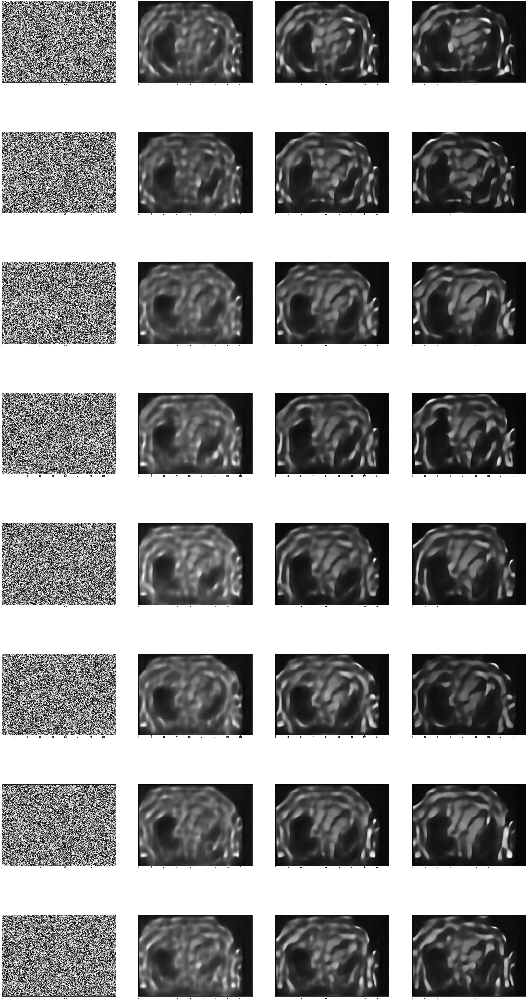

['input_strip_continuous', 'input_lax_4ch_diastole_slice0_224_3d_continuous']
2020-08-25 11:51:54,280 - plots:1997 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-08-25 11:51:58,844 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/input_lax_4ch_diastole_slice0_224_3d_continuous_noise/
2020-08-25 11:51:58,845 - explorations:57 - INFO - Write predictions as PNGs TensorMap:lax_4ch_diastole_slice0_224_3d, y shape:(8, 160, 224, 1) labels:(8, 160, 224, 1) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/input_lax_4ch_diastole_slice0_224_3d_continuous_noise/


<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [35]:
# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_key = 'input_lax_4ch_diastole_slice0_224_3d_continuous'
test_shape = test_data[test_key].shape
test_data[test_key] = np.random.random(test_shape)
out_path = os.path.join(args.output_folder, args.id, test_key + '_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
noise_preds = plot_ae_towards_attractor(overparameterized_model, test_data, test_labels, test_key, 
                                        test_index=1, rows=8, samples=4, steps = 18)
print(list(test_data.keys()))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], 
                     noise_preds[0], out_path, test_paths)
predictions_to_pngs(noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

2020-08-25 11:50:26,473 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:50:26,474 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).
2020-08-25 11:50:26,474 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-08-25 11:50:26,475 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_224_3d_continuous and shape:(8, 160, 224, 1).


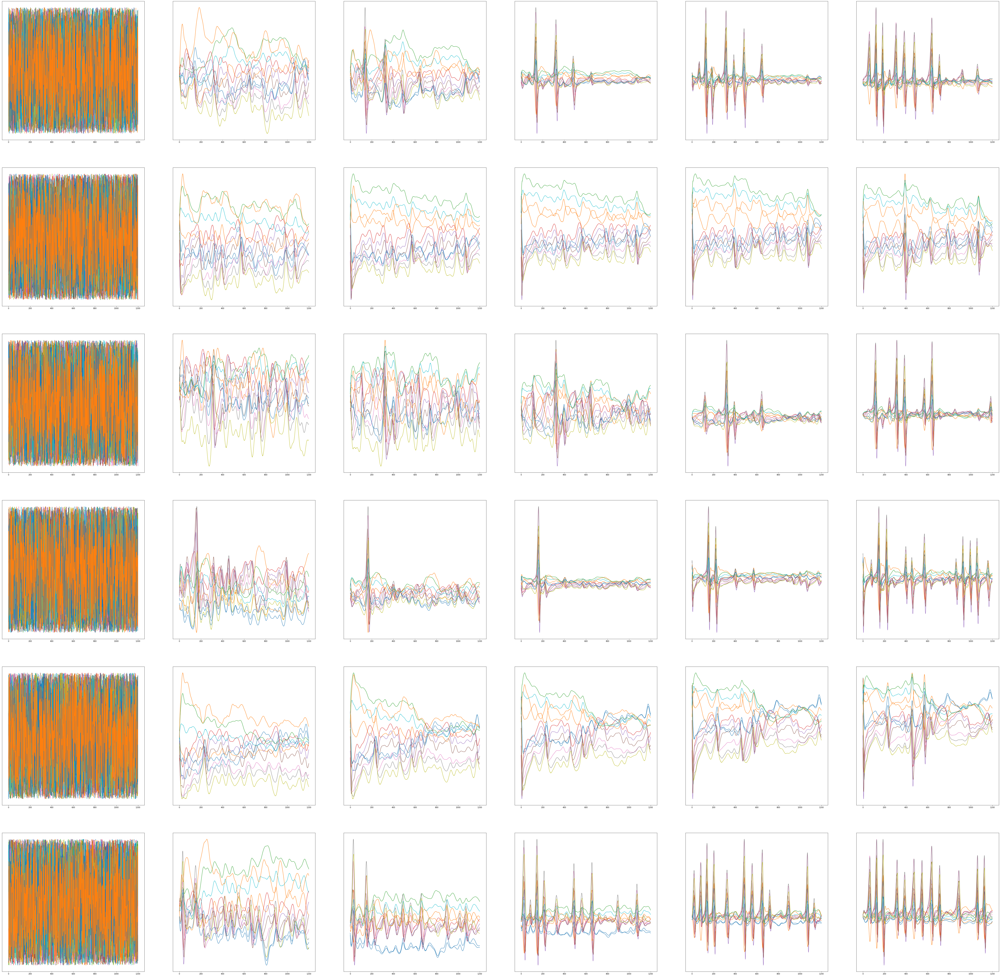

['input_strip_continuous', 'input_lax_4ch_diastole_slice0_224_3d_continuous']
2020-08-25 11:50:42,370 - plots:1997 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-08-25 11:50:47,137 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/input_strip_continuous_noise/
2020-08-25 11:50:47,138 - explorations:57 - INFO - Write predictions as PNGs TensorMap:lax_4ch_diastole_slice0_224_3d, y shape:(8, 160, 224, 1) labels:(8, 160, 224, 1) folder:./recipes_output/ecg_mri_lax_4ch_diastole_euclid_paired_autoencoder_512d/input_strip_continuous_noise/


<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [33]:
# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_key = 'input_strip_continuous'
test_shape = test_data[test_key].shape
test_data[test_key] = np.random.random(test_shape)
out_path = os.path.join(args.output_folder, args.id, test_key + '_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
noise_preds = plot_ae_towards_attractor(overparameterized_model, test_data, test_labels, test_key, 
                                        test_index=0, rows=6, samples=6, steps = 24)
print(list(test_data.keys()))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], 
                     noise_preds[0], out_path, test_paths)
predictions_to_pngs(noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8489 entries, 0 to 8488
Columns: 561 entries, sample_id to latent_511
dtypes: float64(557), int64(2), object(2)
memory usage: 36.4+ MB
False    2329
True       11
Name: has_ttntv, dtype: int64


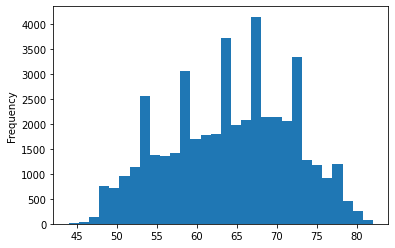

In [22]:
df = pd.read_csv('/home/sam/ml/trained_models/lax_4ch_diastole_autoencode_leaky_converge/tensors_all_union.csv')
df['21003_Age-when-attended-assessment-centre_2_0'].plot.hist(bins=30)
hidden_inference = './recipes_output/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples/hidden_inference_ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples.tsv'


df2 = pd.read_csv(hidden_inference, sep='\t')
df['fpath'] = pd.to_numeric(df['fpath'], errors='coerce')
df2['sample_id'] = pd.to_numeric(df2['sample_id'], errors='coerce')
#df.info()
latent_df = pd.merge(df, df2, left_on='fpath', right_on='sample_id', how='inner')
#latent_df.info()
df3 = pd.read_csv('/home/sam/tsvs/ttn_disease.tsv', sep='\t')
df4 = pd.read_csv('/home/sam/csvs/has_exome.csv')
latent_df = pd.merge(df3, latent_df, left_on='sample_id', right_on='sample_id', how='right')
latent_df.info()
print(latent_df['has_ttntv'].value_counts())

In [55]:
def pca_on_matrix(matrix, pca_components):
    pca = PCA()
    pca.fit(matrix)
    print(f'PCA explains {100*np.sum(pca.explained_variance_ratio_[:pca_components]):0.1f}% of variance with {pca_components} top PCA components.')
    matrix_reduced = pca.transform(matrix)[:, :pca_components]
    print(f'PCA reduces matrix shape:{matrix_reduced.shape} from matrix shape: {matrix.shape}')
    plot_scree(pca_components, 100*pca.explained_variance_ratio_)
    return pca, matrix_reduced

def plot_scree(pca_components, percent_explained):
    _ = plt.figure(figsize=(6, 4))
    plt.plot(range(len(percent_explained)), percent_explained, 'g.-', linewidth=1)
    plt.axvline(x=pca_components, c='r', linewidth=3)
    label = f'{np.sum(percent_explained[:pca_components]):0.1f}% of variance explained by top {pca_components} of {len(percent_explained)} components'
    plt.text(pca_components+0.02*len(percent_explained), percent_explained[1], label)
    plt.title('Scree Plot')
    plt.xlabel('Principal Components')
    plt.ylabel('% of Variance Explained by Each Component')
    figure_path = f'./results/pca_{pca_components}_of_{len(percent_explained)}_testimonials.png'
    if not os.path.exists(os.path.dirname(figure_path)):
        os.makedirs(os.path.dirname(figure_path))
    plt.savefig(figure_path)
    
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) * 180 / 3.141592

def directions_in_latent_space(stratify_column, stratify_thresh, split_column, split_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    strat_vector = hit_mean_vector - miss_mean_vector
    
    hit1 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    miss1 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    hit2 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss2 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss_mean_vector1 = np.mean(miss1, axis=0)
    hit_mean_vector1 = np.mean(hit1, axis=0)
    angle1 = angle_between(miss_mean_vector1, hit_mean_vector1)
    miss_mean_vector2 = np.mean(miss2, axis=0)
    hit_mean_vector2 = np.mean(hit2, axis=0)
    angle2 = angle_between(miss_mean_vector2, hit_mean_vector2)
    h1_vector = hit_mean_vector1-miss_mean_vector1
    h2_vector = hit_mean_vector2-miss_mean_vector2
    angle3 = angle_between(h1_vector, h2_vector)
    angle4 = angle_between(strat_vector, h1_vector)
    angle5 = angle_between(strat_vector, h2_vector)
    print(f'\n Between {stratify_column}, and splits: {split_column}\n',
          f'Angles h1 and m1: {angle1:.2f}, h2 and m2 {angle2:.2f} h1-m1 and h2-m2 {angle3:.2f} degrees.\n'
          f'stratify threshold: {stratify_thresh}, split thresh: {split_thresh}, \n'
          f'hit_mean_vector2 shape {miss_mean_vector1.shape}, miss1:{hit_mean_vector2.shape} \n'
          f'Hit1 shape {hit1.shape}, miss1:{miss1.shape} threshold:{stratify_thresh}\n'
          f'Hit2 shape {hit2.shape}, miss2:{miss2.shape}\n')

def stratify_latent_space(stratify_column, stratify_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    angle = angle_between(miss_mean_vector, hit_mean_vector)
    print(f'Angle between {stratify_column} centroid and all others is: {angle:.1f} degrees.\n'
          f'Hit shape {hit.shape}, miss:{miss.shape} threshold:{stratify_thresh}\n'
          f'Distance: {np.linalg.norm(hit_mean_vector-miss_mean_vector):.3f}, Hit std {np.std(hit, axis=1).mean():.3f}, miss std:{np.std(miss, axis=1).mean():.3f}\n')
    
def plot_pcs(sides, color_key):
    f, axes = plt.subplots(sides, sides, figsize=(16, 16))
    for i, ax in enumerate(axes.ravel()):
        colors = latent_df[color_key].to_numpy()
        points = ax.scatter(matrix_reduce[:, i], matrix_reduce[:, i+1], c=colors)
        f.colorbar(points, ax=ax)
        



PCA explains 77.6% of variance with 10 top PCA components.
PCA reduces matrix shape:(8489, 10) from matrix shape: (8489, 256)
Angle between Sex_Female_0_0 centroid and all others is: 36.0 degrees.
Hit shape (4380, 256), miss:(4109, 256) threshold:1.0
Distance: 0.007, Hit std 0.005, miss std:0.005

Angle between has_ttntv centroid and all others is: 63.0 degrees.
Hit shape (11, 256), miss:(2329, 256) threshold:1.0
Distance: 0.024, Hit std 0.005, miss std:0.005

Angle between atrial_fibrillation_or_flutter centroid and all others is: 27.0 degrees.
Hit shape (314, 256), miss:(8175, 256) threshold:1.0
Distance: 0.005, Hit std 0.005, miss std:0.005

Angle between coronary_artery_disease centroid and all others is: 20.5 degrees.
Hit shape (319, 256), miss:(8170, 256) threshold:1.0
Distance: 0.004, Hit std 0.005, miss std:0.005

Angle between hypertension centroid and all others is: 10.8 degrees.
Hit shape (2782, 256), miss:(5707, 256) threshold:1.0
Distance: 0.002, Hit std 0.005, miss std:0.

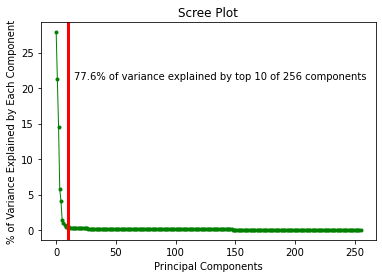

In [56]:
import matplotlib.pyplot as plt
latent_dimension = 256
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 39.9% of variance with 10 top PCA components.
PCA reduces matrix shape:(8489, 10) from matrix shape: (8489, 256)
Angle between Sex_Female_0_0 centroid and all others is: 102.0 degrees.
Hit shape (4380, 256), miss:(4109, 256) threshold:1.0
Distance: 0.025, Hit std 0.005, miss std:0.005

Angle between has_ttntv centroid and all others is: 60.7 degrees.
Hit shape (11, 256), miss:(2329, 256) threshold:1.0
Distance: 0.025, Hit std 0.005, miss std:0.005

Angle between atrial_fibrillation_or_flutter centroid and all others is: 49.0 degrees.
Hit shape (314, 256), miss:(8175, 256) threshold:1.0
Distance: 0.012, Hit std 0.005, miss std:0.005

Angle between coronary_artery_disease centroid and all others is: 54.9 degrees.
Hit shape (319, 256), miss:(8170, 256) threshold:1.0
Distance: 0.012, Hit std 0.005, miss std:0.005

Angle between hypertension centroid and all others is: 46.0 degrees.
Hit shape (2782, 256), miss:(5707, 256) threshold:1.0
Distance: 0.010, Hit std 0.005, miss std:0

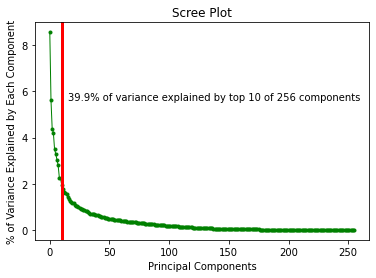

In [57]:
import matplotlib.pyplot as plt
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 50.3% of variance with 10 top PCA components.
PCA reduces matrix shape:(8489, 10) from matrix shape: (8489, 512)
Angle between Sex_Female_0_0 centroid and all others is: 82.0 degrees.
Hit shape (4380, 512), miss:(4109, 512) threshold:1.0
Distance: 0.026, Hit std 0.005, miss std:0.005

Angle between atrial_fibrillation_or_flutter centroid and all others is: 42.7 degrees.
Hit shape (314, 512), miss:(8175, 512) threshold:1.0
Distance: 0.013, Hit std 0.005, miss std:0.005

Angle between coronary_artery_disease centroid and all others is: 42.9 degrees.
Hit shape (319, 512), miss:(8170, 512) threshold:1.0
Distance: 0.013, Hit std 0.005, miss std:0.005

Angle between hypertension centroid and all others is: 34.5 degrees.
Hit shape (2782, 512), miss:(5707, 512) threshold:1.0
Distance: 0.010, Hit std 0.005, miss std:0.005

Angle between LVEF centroid and all others is: 50.1 degrees.
Hit shape (988, 512), miss:(15, 512) threshold:45
Distance: 0.024, Hit std 0.005, miss std:0.005

An

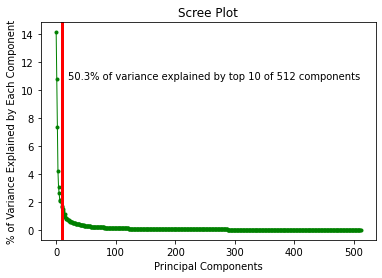

In [58]:
latent_dimension = 512
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 39.9% of variance with 10 top PCA components.
PCA reduces matrix shape:(8489, 10) from matrix shape: (8489, 256)

 Between Sex_Female_0_0, and splits: LVEF
 Angles h1 and m1: 103.52, h2 and m2 97.58 h1-m1 and h2-m2 46.96 degrees.
stratify threshold: 1.0, split thresh: 50, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (537, 256), miss1:(402, 256) threshold:1.0
Hit2 shape (20, 256), miss2:(44, 256)


 Between Sex_Female_0_0, and splits: LVM
 Angles h1 and m1: 78.11, h2 and m2 97.83 h1-m1 and h2-m2 43.59 degrees.
stratify threshold: 1.0, split thresh: 100, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (18, 256), miss1:(268, 256) threshold:1.0
Hit2 shape (541, 256), miss2:(178, 256)


 Between Sex_Female_0_0, and splits: LVEDV
 Angles h1 and m1: 88.86, h2 and m2 97.84 h1-m1 and h2-m2 30.01 degrees.
stratify threshold: 1.0, split thresh: 150, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (73, 256), miss1:(296, 256) threshold:1.0
Hit2 shape (486,

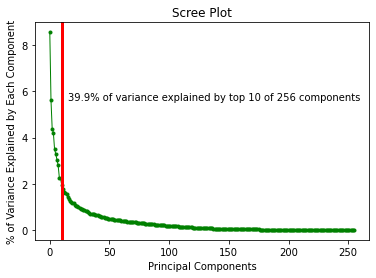

In [59]:
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'Sex_Female_0_0']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 3750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 1.0, strat, thresh, latent_cols, latent_df)

PCA explains 39.9% of variance with 10 top PCA components.
PCA reduces matrix shape:(8489, 10) from matrix shape: (8489, 256)

 Between sample_id, and splits: LVEF
 Angles h1 and m1: 21.96, h2 and m2 64.90 h1-m1 and h2-m2 86.34 degrees.
stratify threshold: 3750000.0, split thresh: 50, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (516, 256), miss1:(423, 256) threshold:3750000.0
Hit2 shape (45, 256), miss2:(19, 256)


 Between sample_id, and splits: LVM
 Angles h1 and m1: 25.65, h2 and m2 20.67 h1-m1 and h2-m2 92.54 degrees.
stratify threshold: 3750000.0, split thresh: 100, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (155, 256), miss1:(131, 256) threshold:3750000.0
Hit2 shape (407, 256), miss2:(312, 256)


 Between sample_id, and splits: LVEDV
 Angles h1 and m1: 30.74, h2 and m2 21.25 h1-m1 and h2-m2 98.57 degrees.
stratify threshold: 3750000.0, split thresh: 150, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (206, 256), miss1:(163, 256) threshold:3750

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)



 Between sample_id, and splits: 21003_Age-when-attended-assessment-centre_2_0
 Angles h1 and m1: 14.95, h2 and m2 10.07 h1-m1 and h2-m2 96.10 degrees.
stratify threshold: 3750000.0, split thresh: 70, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (1061, 256), miss1:(1042, 256) threshold:3750000.0
Hit2 shape (3183, 256), miss2:(3203, 256)



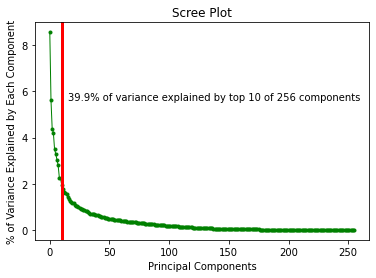

In [60]:
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'sample_id']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 3750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 3750000.0, strat, thresh, latent_cols, latent_df)

In [84]:
latent_dimension = 256
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
ecg_encode = latent_df[latent_cols].to_numpy()
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
mri_encode = latent_df[latent_cols].to_numpy()
diff = np.sqrt(np.einsum('ij, ij->ij', ecg_encode - mri_encode, ecg_encode - mri_encode))
print(diff.shape) 
print(np.mean(diff))

(8489, 256)
0.005006686971828161


In [63]:
print(f'{ecg_encode[:5,:5]} \n{mri_encode[:5,:5]}')

[[ 0.00139863 -0.00271188 -0.00283739  0.0003897   0.00058096]
 [ 0.00201197 -0.00257575  0.00099087  0.00127496  0.00066187]
 [-0.00237911 -0.00280201  0.00249821 -0.00290806  0.00149933]
 [-0.00551842  0.0026608  -0.00103735 -0.00042469 -0.00166797]
 [ 0.00513465  0.00890724 -0.00138563  0.00328633  0.00080897]] 
[[ 2.72795511e-03 -1.56089547e-03  2.22708727e-03 -5.11551742e-03
   8.00262205e-05]
 [ 9.30869486e-03  1.62243517e-03 -4.21400648e-03  1.73088943e-03
  -4.92238323e-04]
 [-6.50920556e-04 -2.63527571e-03  2.45257257e-03  2.67036236e-03
  -5.85530000e-03]
 [-1.82451389e-03 -3.80108296e-03  2.64703645e-03  5.66090690e-03
   1.38684385e-03]
 [-4.66642203e-03 -6.04260340e-03 -5.38774487e-03 -3.02108866e-03
  -6.62890263e-04]]


In [88]:
latent_dimension = 256
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
ecg_encode = latent_df[latent_cols].to_numpy()
latent_cols = [f'latent_{18+i}' for i in range(latent_dimension)]
mri_encode = latent_df[latent_cols].to_numpy()
diff = np.sqrt(np.einsum('ij, ij->ij', ecg_encode - mri_encode, ecg_encode - mri_encode))
print(diff.shape) 
print(np.mean(diff))

(8489, 256)
0.004966324344478861


In [89]:
ch2_random = np.random.random((4452, 256))
ch3_random = np.random.random((4452, 256))
diff = np.sqrt(np.einsum('ij, ij->ij', ch2_random - ch3_random, ch2_random - ch3_random))
print(diff.shape) 
print(np.mean(diff))

(4452, 256)
0.3333968114888889


In [90]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/', 
            '--input_tensors', 'ecg.ecg_rest', 'mri.lax_4ch_diastole_slice0_224_3d', 
            '--output_tensors', 'ecg.ecg_rest', 'mri.lax_4ch_diastole_slice0_224_3d',
            '--activation', 'swish',
            '--conv_layers', '32',
            '--conv_x', '9', '9', '9',
            '--conv_y', '3', '3', '3', 
            '--conv_z', '3', '3', '3', 
            '--dense_blocks', '32', '32', '32',
            '--block_size', '3',
            '--dense_layers', '256',
            '--pool_x', '2',
            '--pool_y', '2',
            '--batch_size', '1',
            '--patience', '44',
            '--epochs', '532',
            '--learning_rate', '0.0002',
            '--training_steps', '72',
            '--validation_steps', '30',
            '--test_steps', '8',
            '--num_workers', '4',
            '--inspect_model',
            '--tensormap_prefix', 'ml4cvd.tensormap.ukb',
            '--hidden_layer', 'concatenate_36',
            '--model_file', './recipes_output/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples.h5',
            '--train_csv', '/home/sam/lvh/small_set.csv',
            #'--sample_csv', '/home/sam/lvh/lvh_hold_out.txt',
            '--id', 'ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples']
args = parse_args()

#overparameterized_model = make_multimodal_multitask_model(**args.__dict__)
#infer_hidden_layer_multimodal_multitask(args)
#generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
# train_model_from_generators(
#         overparameterized_model, generate_train, generate_valid, args.training_steps, args.validation_steps, args.batch_size,
#         args.epochs, args.patience, args.output_folder, args.id, args.inspect_model, args.inspect_show_labels,
# )

2020-08-24 16:58:27,768 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples/log_2020-08-24_16-58_0.log.
2020-08-24 16:58:27,770 - arguments:414 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/sax-lax-40k-lvm/2020-01-29/ --input_tensors ecg.ecg_rest mri.lax_4ch_diastole_slice0_224_3d --output_tensors ecg.ecg_rest mri.lax_4ch_diastole_slice0_224_3d --activation swish --conv_layers 32 --conv_x 9 9 9 --conv_y 3 3 3 --conv_z 3 3 3 --dense_blocks 32 32 32 --block_size 3 --dense_layers 256 --pool_x 2 --pool_y 2 --batch_size 1 --patience 44 --epochs 532 --learning_rate 0.0002 --training_steps 72 --validation_steps 30 --test_steps 8 --num_workers 4 --inspect_model --tensormap_prefix ml4cvd.tensormap.ukb --hidden_layer concatenate_36 --model_file ./recipes_output/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples/ecg_mri_lax_4ch_diastole_p